In [16]:
# include all the imports here
import os
import io
import pandas as pd
import numpy as np
import tensorflow as tf
import cv2
import pydicom
import random
import matplotlib.pyplot as plt
import zipfile
from PIL import Image
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import (Conv2D, MaxPooling2D, Flatten, Dense,
                                     Dropout, GlobalAveragePooling2D, Input, AveragePooling2D)
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.utils import Sequence
from tensorflow.keras import layers, models, optimizers, callbacks
from sklearn.metrics import classification_report, confusion_matrix
from functools import lru_cache
from glob import glob

import warnings
warnings.filterwarnings("ignore")

In [2]:
train_labels_path =  'stage_2_train_labels.csv'
class_info_path = 'stage_2_detailed_class_info.csv'

# Load CSV files
train_labels_df = pd.read_csv(train_labels_path)
class_info_df = pd.read_csv(class_info_path)

# Display first few rows of each DataFrame
print("Train Labels DataFrame (First 5 rows):")
print("-" * 80)
print(train_labels_df.head())
print("\n\nClass Info DataFrame (First 5 rows):")
print("-" * 80)
print(class_info_df.head())


# Basic stats about the datasets
print("\nTrain Labels DataFrame Info:")
print("-" * 80)
print(f"Shape: {train_labels_df.shape}")
print(f"Columns: {train_labels_df.columns.tolist()}")

print("\n\nClass Info DataFrame Info:")
print("-" * 80)
print(f"Shape: {class_info_df.shape}")
print(f"Columns: {class_info_df.columns.tolist()}")


# Check for missing values
print("\nMissing values in Train Labels DataFrame:")
print("-" * 80)
print(train_labels_df.isnull().sum())
print("\n\nMissing values in Class Info DataFrame:")
print("-" * 80)
print(class_info_df.isnull().sum())


# Count unique patients
unique_patients_labels = train_labels_df['patientId'].nunique()
unique_patients_class = class_info_df['patientId'].nunique()
print(f"\n\nNumber of unique patients in Train Labels: {unique_patients_labels}")
print("-" * 80)
print(f"Number of unique patients in Class Info: {unique_patients_class}")
print("-" * 80)

#Check for any Duplicate entries in Dataset
print('Count of Duplicates: ', train_labels_df.duplicated().sum())
print("-" * 80)

print('Count of Duplicates: ', class_info_df.duplicated().sum())
print("-" * 80)
df_class_info_clean = class_info_df.drop_duplicates()
print("After dropping duplicates:", df_class_info_clean.shape)


Train Labels DataFrame (First 5 rows):
--------------------------------------------------------------------------------
                              patientId      x      y  width  height  Target
0  0004cfab-14fd-4e49-80ba-63a80b6bddd6    NaN    NaN    NaN     NaN       0
1  00313ee0-9eaa-42f4-b0ab-c148ed3241cd    NaN    NaN    NaN     NaN       0
2  00322d4d-1c29-4943-afc9-b6754be640eb    NaN    NaN    NaN     NaN       0
3  003d8fa0-6bf1-40ed-b54c-ac657f8495c5    NaN    NaN    NaN     NaN       0
4  00436515-870c-4b36-a041-de91049b9ab4  264.0  152.0  213.0   379.0       1


Class Info DataFrame (First 5 rows):
--------------------------------------------------------------------------------
                              patientId                         class
0  0004cfab-14fd-4e49-80ba-63a80b6bddd6  No Lung Opacity / Not Normal
1  00313ee0-9eaa-42f4-b0ab-c148ed3241cd  No Lung Opacity / Not Normal
2  00322d4d-1c29-4943-afc9-b6754be640eb  No Lung Opacity / Not Normal
3  003d8fa0-6bf1-4

In [3]:
# Merge train_labels with class_info to have labels and bounding boxex together
train_data_merged = pd.merge(train_labels_df, df_class_info_clean, on='patientId', how='left')


Class distribution:
 class
No Lung Opacity / Not Normal    11821
Lung Opacity                     9555
Normal                           8851
Name: count, dtype: int64


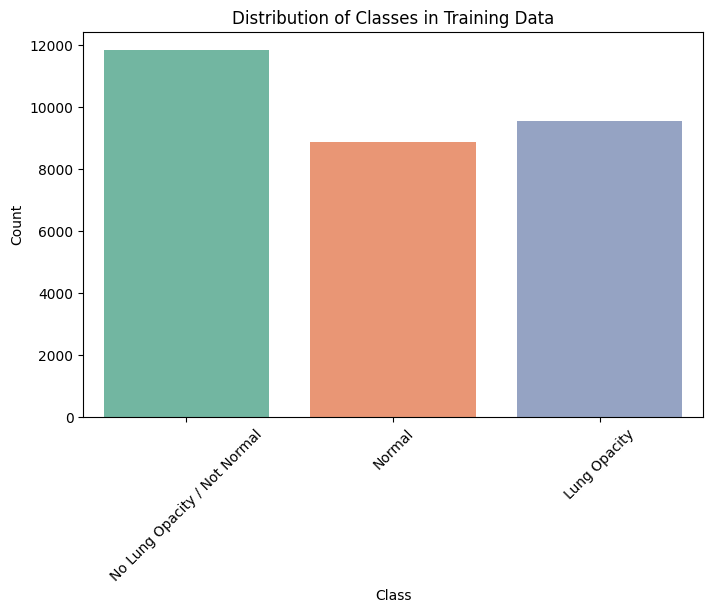

In [4]:
import seaborn as sns
import matplotlib.pyplot as plt

# Class distribution count
class_distribution = train_data_merged['class'].value_counts()
print("\nClass distribution:\n", class_distribution)

# Visualize class distribution
plt.figure(figsize=(8, 5))
sns.countplot(x='class', data=train_data_merged, palette='Set2', hue='class')
plt.title("Distribution of Classes in Training Data")
plt.ylabel("Count")
plt.xlabel("Class")
plt.xticks(rotation=45)
plt.show()


In [6]:
import os
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from PIL import Image

In [8]:
# Split DataFrame
train_df, val_df = train_test_split(train_data_merged, test_size=0.2, random_state=42, stratify=train_data_merged['class'])


In [16]:
import os
import pandas as pd
import pydicom
import numpy as np
from PIL import Image
from sklearn.model_selection import train_test_split

# === CONFIG ===
DICOM_DIR = 'C://Users//asus//Downloads//stage_2_train_images//stage_2_train_images'  # Folder with 26,684 .dcm files
OUTPUT_DIR = './yolo_dataset'       # Output folder
IMAGE_SIZE = (1024, 1024)           # Resize images if needed
CLASS_MAP = {
    'No Lung Opacity / Not Normal': 0,
    'Lung Opacity': 1,
    'Normal': 2
}
VAL_RATIO = 0.2  # 20% validation split

# === LOAD CSVs ===
labels = pd.read_csv('C://Users//asus//Downloads//stage_2_train_labels.csv')
class_info = pd.read_csv('C://Users//asus//Downloads//stage_2_detailed_class_info.csv')
df = pd.merge(labels, class_info, on='patientId')
df['class_id'] = df['class'].map(CLASS_MAP)

# === GET IMAGE LIST ===
all_ids = df['patientId'].unique()
train_ids, val_ids = train_test_split(all_ids, test_size=VAL_RATIO, random_state=42)

# === UTILS ===
def convert_dicom_to_jpg(dcm_path, jpg_path):
    dcm = pydicom.dcmread(dcm_path)
    img_array = dcm.pixel_array
    img = Image.fromarray(img_array).convert("L")
    img = img.resize(IMAGE_SIZE)
    img.save(jpg_path)

def convert_annotations(df_rows, img_w, img_h):
    yolo_lines = []
    for _, row in df_rows.iterrows():
        x_center = (row['x'] + row['width'] / 2) / img_w
        y_center = (row['y'] + row['height'] / 2) / img_h
        w = row['width'] / img_w
        h = row['height'] / img_h
        yolo_lines.append(f"{row['class_id']} {x_center:.6f} {y_center:.6f} {w:.6f} {h:.6f}")
    return yolo_lines

def process_subset(ids, subset):
    img_out = os.path.join(OUTPUT_DIR, 'images', subset)
    lbl_out = os.path.join(OUTPUT_DIR, 'labels', subset)
    os.makedirs(img_out, exist_ok=True)
    os.makedirs(lbl_out, exist_ok=True)

    for pid in ids:
        dcm_path = os.path.join(DICOM_DIR, pid + '.dcm')
        jpg_path = os.path.join(img_out, pid + '.jpg')
        txt_path = os.path.join(lbl_out, pid + '.txt')

        try:
            convert_dicom_to_jpg(dcm_path, jpg_path)
            img_w, img_h = IMAGE_SIZE
            rows = df[df['patientId'] == pid]
            if not rows.empty:
                yolo_lines = convert_annotations(rows, img_w, img_h)
                print(f"Writing {len(yolo_lines)} YOLO annotations for {pid}.")
                with open(txt_path, 'w') as f:
                    f.write('\n'.join(yolo_lines))
                    
        except Exception as e:
            print(f"Error processing {pid}: {e}")

# === PROCESS DATA ===
print("Processing training set...")
process_subset(train_ids, 'train')
print("Processing validation set...")
process_subset(val_ids, 'val')

Processing training set...
Writing 1 YOLO annotations for f94ed461-a19b-48df-a5f2-261b944ba1e9.
Writing 1 YOLO annotations for a4b25feb-c992-4481-b31e-6367c3dbabb2.
Writing 1 YOLO annotations for e71052e4-9d93-4992-a607-0bf65032099c.
Writing 1 YOLO annotations for fb92d9dc-51e7-4311-8e68-ccc610fc175a.
Writing 1 YOLO annotations for a44df0ff-7eab-4bfd-b841-5d26e9088933.
Writing 1 YOLO annotations for 0793267b-ba31-4f77-bee8-acde7a571231.
Writing 1 YOLO annotations for ac8eca4c-6e21-4ed3-95af-8157ff7b7554.
Writing 1 YOLO annotations for 8b9684d6-8084-4405-90b9-7add2120fd71.
Writing 1 YOLO annotations for dd44751e-c7f5-490e-82dd-6b314061e377.
Writing 1 YOLO annotations for e740c681-6c4c-45d1-a8f1-5e33a0ed4140.
Writing 1 YOLO annotations for 7211cf02-869d-48f9-a79d-108fc6da2599.
Writing 1 YOLO annotations for 5f71c85d-f8c7-4e05-89db-a61537dc3f97.
Writing 1 YOLO annotations for b73af135-9b6b-4bb3-bfd5-b9439674003b.
Writing 1 YOLO annotations for 452a76e3-b825-4dd4-afaa-f2d0e2fd530f.
Writing

In [11]:
import yaml

OUTPUT_DIR = './yolo_dataset'  
CLASS_MAP = {
    'No Lung Opacity / Not Normal': 0,
    'Lung Opacity': 1,
    'Normal': 2
}
# Define the dataset.yaml content
dataset_yaml = {
	'train': f'{OUTPUT_DIR}/images/train',
	'val': f'{OUTPUT_DIR}/images/val',
	'nc': len(CLASS_MAP),
	'names': list(CLASS_MAP.keys())
}

# Write to dataset.yaml
with open('dataset.yaml', 'w') as f:
	yaml.dump(dataset_yaml, f, default_flow_style=False)

print("dataset.yaml created successfully.")


dataset.yaml created successfully.


In [ ]:
!pip install ultralytics
from ultralytics import YOLO

# Load a YOLOv8 model (use 'yolov8n.pt', 'yolov8s.pt', etc. or your custom weights)
model = YOLO('yolov8n.pt')

# Train the model
results = model.train(
    data='dataset.yaml',    # path to your dataset.yaml
    epochs=50,              # number of training epochs
    imgsz=640,              # image size
    batch=16,               # batch size
    name='pneumonia_yolov8n' # experiment name
)

New https://pypi.org/project/ultralytics/8.3.148 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.147  Python-3.10.16 torch-2.7.0+cpu CPU (12th Gen Intel Core(TM) i7-12650H)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=dataset.yaml, degrees=0.0, deterministic=True, device=cpu, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=pneumonia_yolov8n, nbs=64, nms=False, opset=None, optimize=F

train: Scanning C:\Users\asus\Downloads\yolo_dataset\labels\train.cache... 21347 images, 0 backgrounds, 16564 corrupt: 100%|██████████| 21347/21347 [00:00<?, ?it/s]

train: C:\Users\asus\Downloads\yolo_dataset\images\train\0004cfab-14fd-4e49-80ba-63a80b6bddd6.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates []
train: C:\Users\asus\Downloads\yolo_dataset\images\train\000924cf-0f8d-42bd-9158-1af53881a557.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates []
train: C:\Users\asus\Downloads\yolo_dataset\images\train\000db696-cf54-4385-b10b-6b16fbb3f985.jpg: 2 duplicate labels removed
train: C:\Users\asus\Downloads\yolo_dataset\images\train\000fe35a-2649-43d4-b027-e67796d412e0.jpg: 2 duplicate labels removed
train: C:\Users\asus\Downloads\yolo_dataset\images\train\001031d9-f904-4a23-b3e5-2c088acd19c6.jpg: 2 duplicate labels removed
train: C:\Users\asus\Downloads\yolo_dataset\images\train\0010f549-b242-4e94-87a8-57d79de215fc.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates []
train: C:\Users\asus\Downloads\yolo_dataset\images\train\0022073f-cec8-42ec-ab5f-bc2314649235.


c:\Users\asus\anaconda3\envs\py310_env\lib\site-packages\torch\utils\data\dataloader.py:665: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  warnings.warn(warn_msg)
val: Scanning C:\Users\asus\Downloads\yolo_dataset\labels\val.cache... 5337 images, 0 backgrounds, 4108 corrupt: 100%|██████████| 5337/5337 [00:00<?, ?it/s]

val: C:\Users\asus\Downloads\yolo_dataset\images\val\0025d2de-bd78-4d36-9f72-e15a5e22ca82.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates []
val: C:\Users\asus\Downloads\yolo_dataset\images\val\00293de0-a530-41dc-9621-0b3def01d06d.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates []
val: C:\Users\asus\Downloads\yolo_dataset\images\val\002c591d-df62-4e34-8eda-838c664430a9.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates []
val: C:\Users\asus\Downloads\yolo_dataset\images\val\002cb550-2e31-42f1-a29d-fbc279977e71.jpg: 2 duplicate labels removed
val: C:\Users\asus\Downloads\yolo_dataset\images\val\0053ee32-1e03-4dc2-a103-f46ad0448787.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates []
val: C:\Users\asus\Downloads\yolo_dataset\images\val\006cec2e-6ce2-4549-bffa-eadfcd1e9970.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates []
val: C:\Users\asus


c:\Users\asus\anaconda3\envs\py310_env\lib\site-packages\torch\utils\data\dataloader.py:665: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  warnings.warn(warn_msg)


Plotting labels to runs\detect\pneumonia_yolov8n\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001429, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs\detect\pneumonia_yolov8n
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50         0G      1.998       2.87      1.962         38        640: 100%|██████████| 299/299 [15:34<00:00,  3.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [01:42<00:00,  2.64s/it]

                   all       1229       1951      0.292      0.336      0.238     0.0741



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50         0G      1.969      2.287      1.887         36        640: 100%|██████████| 299/299 [14:47<00:00,  2.97s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [01:22<00:00,  2.11s/it]

                   all       1229       1951      0.294      0.371      0.243     0.0712



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50         0G      1.964      2.148      1.866         35        640: 100%|██████████| 299/299 [13:43<00:00,  2.76s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [01:21<00:00,  2.09s/it]


                   all       1229       1951      0.312      0.326      0.249      0.079

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50         0G      1.942      2.079      1.832         43        640: 100%|██████████| 299/299 [13:17<00:00,  2.67s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [01:18<00:00,  2.02s/it]

                   all       1229       1951      0.381      0.442      0.351      0.116



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50         0G       1.93       2.03      1.811         40        640: 100%|██████████| 299/299 [13:19<00:00,  2.67s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [01:19<00:00,  2.04s/it]

                   all       1229       1951      0.442      0.436        0.4       0.14



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50         0G      1.902      1.992      1.776         44        640: 100%|██████████| 299/299 [13:18<00:00,  2.67s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [01:18<00:00,  2.02s/it]

                   all       1229       1951       0.43      0.479      0.406      0.152



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50         0G      1.885      1.982       1.77         47        640: 100%|██████████| 299/299 [13:18<00:00,  2.67s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [01:18<00:00,  2.01s/it]

                   all       1229       1951      0.414      0.441      0.387      0.141



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50         0G      1.886      1.962      1.776         35        640: 100%|██████████| 299/299 [13:11<00:00,  2.65s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [01:18<00:00,  2.01s/it]

                   all       1229       1951      0.429      0.514      0.419      0.162



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50         0G      1.856      1.923      1.752         35        640: 100%|██████████| 299/299 [13:13<00:00,  2.65s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [01:17<00:00,  2.00s/it]

                   all       1229       1951      0.452      0.493      0.442      0.162



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50         0G      1.854      1.895      1.736         46        640: 100%|██████████| 299/299 [13:14<00:00,  2.66s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [01:19<00:00,  2.03s/it]

                   all       1229       1951      0.493       0.52      0.459      0.181



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50         0G       1.84      1.924      1.731         37        640: 100%|██████████| 299/299 [13:15<00:00,  2.66s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [01:19<00:00,  2.04s/it]

                   all       1229       1951      0.487      0.508      0.462      0.172



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50         0G      1.839      1.888      1.732         38        640: 100%|██████████| 299/299 [13:15<00:00,  2.66s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [01:19<00:00,  2.03s/it]

                   all       1229       1951      0.487      0.504      0.466      0.184



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50         0G      1.837      1.887      1.729         40        640: 100%|██████████| 299/299 [13:13<00:00,  2.65s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [01:19<00:00,  2.05s/it]

                   all       1229       1951      0.404      0.436      0.384      0.148



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50         0G      1.829      1.857      1.721         56        640: 100%|██████████| 299/299 [13:17<00:00,  2.67s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [01:19<00:00,  2.05s/it]

                   all       1229       1951      0.432      0.489      0.429      0.173



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50         0G      1.814      1.871      1.706         26        640: 100%|██████████| 299/299 [13:09<00:00,  2.64s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [01:19<00:00,  2.03s/it]

                   all       1229       1951      0.513       0.52      0.493      0.184



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50         0G      1.819      1.838      1.716         42        640: 100%|██████████| 299/299 [13:05<00:00,  2.63s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [01:19<00:00,  2.04s/it]

                   all       1229       1951      0.486      0.526      0.468       0.18



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50         0G      1.788      1.833      1.698         46        640: 100%|██████████| 299/299 [13:08<00:00,  2.64s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [01:19<00:00,  2.04s/it]

                   all       1229       1951      0.481       0.56       0.48      0.184



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50         0G      1.794      1.809      1.696         30        640: 100%|██████████| 299/299 [13:11<00:00,  2.65s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [01:19<00:00,  2.03s/it]

                   all       1229       1951      0.504      0.512      0.472       0.18

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      19/50         0G      1.781      1.813      1.691         42        640: 100%|██████████| 299/299 [13:10<00:00,  2.65s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [01:19<00:00,  2.04s/it]

                   all       1229       1951      0.501      0.518      0.477      0.192



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50         0G      1.779      1.821       1.71         42        640: 100%|██████████| 299/299 [13:17<00:00,  2.67s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [01:20<00:00,  2.06s/it]

                   all       1229       1951      0.444      0.524      0.457      0.188



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50         0G      1.794      1.796      1.697         41        640: 100%|██████████| 299/299 [13:11<00:00,  2.65s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [01:19<00:00,  2.03s/it]

                   all       1229       1951      0.407      0.468      0.386      0.147



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50         0G      1.782      1.796      1.685         48        640: 100%|██████████| 299/299 [13:08<00:00,  2.64s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [01:18<00:00,  2.02s/it]

                   all       1229       1951      0.482      0.543      0.471      0.194



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50         0G      1.777      1.804      1.679         49        640: 100%|██████████| 299/299 [13:10<00:00,  2.64s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [01:19<00:00,  2.04s/it]

                   all       1229       1951       0.46      0.499      0.438      0.178



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50         0G       1.76      1.776      1.671         45        640: 100%|██████████| 299/299 [13:01<00:00,  2.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [01:19<00:00,  2.04s/it]

                   all       1229       1951      0.523       0.56       0.52      0.202



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50         0G      1.762      1.772      1.669         36        640: 100%|██████████| 299/299 [13:02<00:00,  2.62s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [01:18<00:00,  2.02s/it]

                   all       1229       1951      0.491      0.536      0.482      0.196



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50         0G      1.765      1.772      1.671         42        640: 100%|██████████| 299/299 [13:12<00:00,  2.65s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [01:18<00:00,  2.01s/it]

                   all       1229       1951        0.5      0.562      0.497        0.2



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50         0G      1.759      1.766      1.664         38        640: 100%|██████████| 299/299 [13:14<00:00,  2.66s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [01:19<00:00,  2.03s/it]

                   all       1229       1951      0.497      0.557      0.508      0.203



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50         0G      1.745      1.752      1.654         39        640: 100%|██████████| 299/299 [13:16<00:00,  2.66s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [01:19<00:00,  2.04s/it]

                   all       1229       1951      0.522       0.57      0.512       0.21



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50         0G      1.731      1.724      1.639         43        640: 100%|██████████| 299/299 [13:44<00:00,  2.76s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [01:19<00:00,  2.03s/it]

                   all       1229       1951      0.483       0.55      0.476      0.196



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50         0G      1.751      1.732      1.657         48        640: 100%|██████████| 299/299 [13:17<00:00,  2.67s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [01:19<00:00,  2.04s/it]

                   all       1229       1951        0.5      0.567      0.502      0.206

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      31/50         0G      1.733      1.738      1.648         30        640: 100%|██████████| 299/299 [13:14<00:00,  2.66s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [01:20<00:00,  2.05s/it]

                   all       1229       1951       0.52      0.581       0.52      0.211



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50         0G      1.734      1.711      1.643         41        640: 100%|██████████| 299/299 [12:56<00:00,  2.60s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [01:19<00:00,  2.05s/it]

                   all       1229       1951       0.51      0.559      0.508      0.205



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50         0G      1.737      1.707      1.646         35        640: 100%|██████████| 299/299 [13:14<00:00,  2.66s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [01:23<00:00,  2.14s/it]

                   all       1229       1951      0.489      0.574      0.494      0.202



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50         0G      1.718      1.716       1.64         31        640: 100%|██████████| 299/299 [13:53<00:00,  2.79s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [01:25<00:00,  2.19s/it]

                   all       1229       1951      0.521      0.552      0.514      0.211



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50         0G      1.713      1.697      1.634         36        640: 100%|██████████| 299/299 [13:20<00:00,  2.68s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [01:24<00:00,  2.17s/it]

                   all       1229       1951      0.544      0.584       0.54      0.216



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50         0G      1.702      1.692      1.624         48        640: 100%|██████████| 299/299 [15:00<00:00,  3.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [01:26<00:00,  2.22s/it]

                   all       1229       1951      0.506      0.575      0.511      0.212



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50         0G      1.692      1.663      1.618         48        640: 100%|██████████| 299/299 [16:38<00:00,  3.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [01:25<00:00,  2.19s/it]

                   all       1229       1951      0.506      0.569      0.501      0.205



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50         0G      1.692      1.673      1.617         43        640: 100%|██████████| 299/299 [16:36<00:00,  3.33s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [01:43<00:00,  2.65s/it]

                   all       1229       1951      0.478      0.568      0.482      0.197



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50         0G      1.695       1.64       1.61         41        640: 100%|██████████| 299/299 [16:54<00:00,  3.39s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [01:52<00:00,  2.88s/it]

                   all       1229       1951      0.516      0.571      0.508       0.21



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50         0G      1.753      1.731      1.679         47        640:   4%|▍         | 12/299 [00:49<19:47,  4.14s/it]

In [2]:
from ultralytics import YOLO

# Load your best model
model = YOLO('C:/Users/asus/Downloads/runs/detect/pneumonia_yolov8n/weights/best.pt')

# Evaluate on the train set
metrics = model.val(data='dataset.yaml', split='train')
print(metrics)

Ultralytics 8.3.147  Python-3.10.16 torch-2.7.0+cpu CPU (12th Gen Intel Core(TM) i7-12650H)
Model summary (fused): 72 layers, 3,006,233 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access  (ping: 0.20.0 ms, read: 3.60.8 MB/s, size: 53.0 KB)


val: Scanning C:\Users\asus\Downloads\yolo_dataset\labels\train.cache... 21347 images, 0 backgrounds, 16564 corrupt: 100%|██████████| 21347/21347 [00:00<?, ?it/s]

train: C:\Users\asus\Downloads\yolo_dataset\images\train\0004cfab-14fd-4e49-80ba-63a80b6bddd6.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates []
train: C:\Users\asus\Downloads\yolo_dataset\images\train\000924cf-0f8d-42bd-9158-1af53881a557.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates []
train: C:\Users\asus\Downloads\yolo_dataset\images\train\000db696-cf54-4385-b10b-6b16fbb3f985.jpg: 2 duplicate labels removed
train: C:\Users\asus\Downloads\yolo_dataset\images\train\000fe35a-2649-43d4-b027-e67796d412e0.jpg: 2 duplicate labels removed
train: C:\Users\asus\Downloads\yolo_dataset\images\train\001031d9-f904-4a23-b3e5-2c088acd19c6.jpg: 2 duplicate labels removed
train: C:\Users\asus\Downloads\yolo_dataset\images\train\0010f549-b242-4e94-87a8-57d79de215fc.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates []
train: C:\Users\asus\Downloads\yolo_dataset\images\train\0022073f-cec8-42ec-ab5f-bc2314649235.


c:\Users\asus\anaconda3\envs\py310_env\lib\site-packages\torch\utils\data\dataloader.py:665: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  warnings.warn(warn_msg)
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 299/299 [05:07<00:00,  1.03s/it]


                   all       4783       7604      0.578      0.612      0.602       0.25
          Lung Opacity       4783       7604      0.578      0.612      0.602       0.25
Speed: 0.6ms preprocess, 44.8ms inference, 0.0ms loss, 0.5ms postprocess per image
Results saved to runs\detect\val
ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x000002E17E88F190>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026

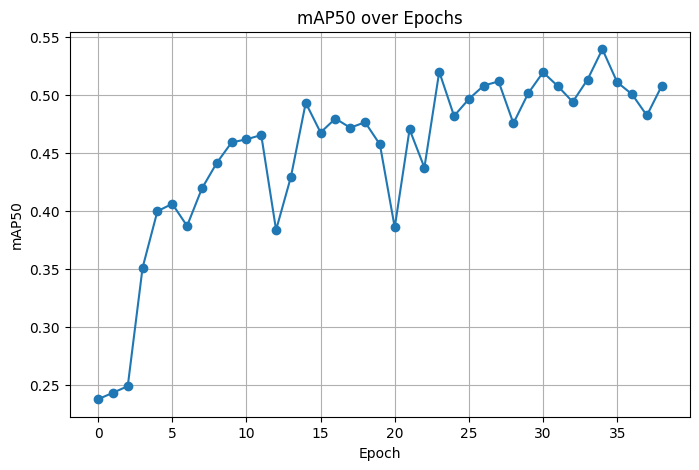

In [12]:
%matplotlib inline
import pandas as pd
import matplotlib.pyplot as plt

# Path to the results.csv file generated by YOLOv8 training
csv_path = 'runs/detect/pneumonia_yolov8n/results.csv'

# Read the CSV file
df = pd.read_csv(csv_path)

# Plot mAP50 over epochs
plt.figure(figsize=(8, 5))
plt.plot(df['metrics/mAP50(B)'], marker='o')
plt.xlabel('Epoch')
plt.ylabel('mAP50')
plt.title('mAP50 over Epochs')
plt.grid(True)
plt.show()

In [ ]:
model.export(format='onnx')